Loaded 23 entries from annotated_and_labeled_29.json

VOID DETECTION ANALYSIS RESULTS
Image: IMG0018.jpg | Filling ID: 2 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


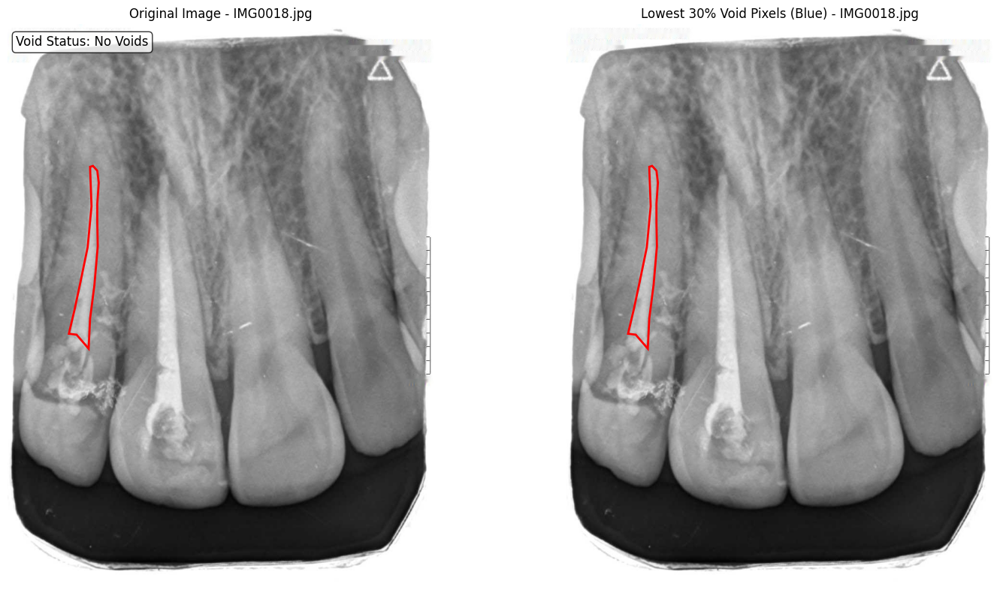

Image: IMG0018.jpg | Filling ID: 3 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


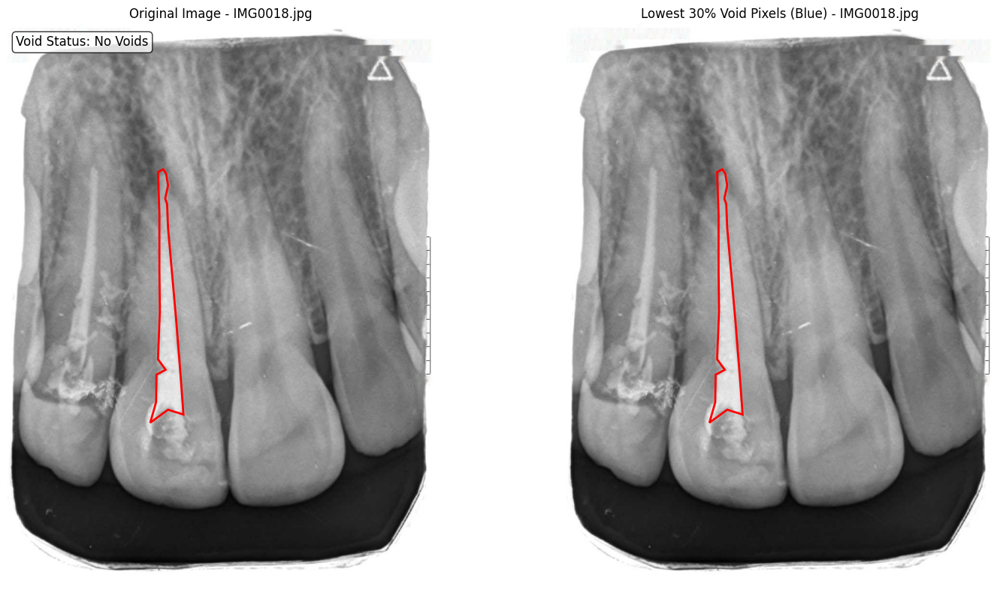

Image: IMG0078.jpg | Filling ID: 1 | Status: Voids Detected | Void Pixels: 19103 | Ground Truth: Present


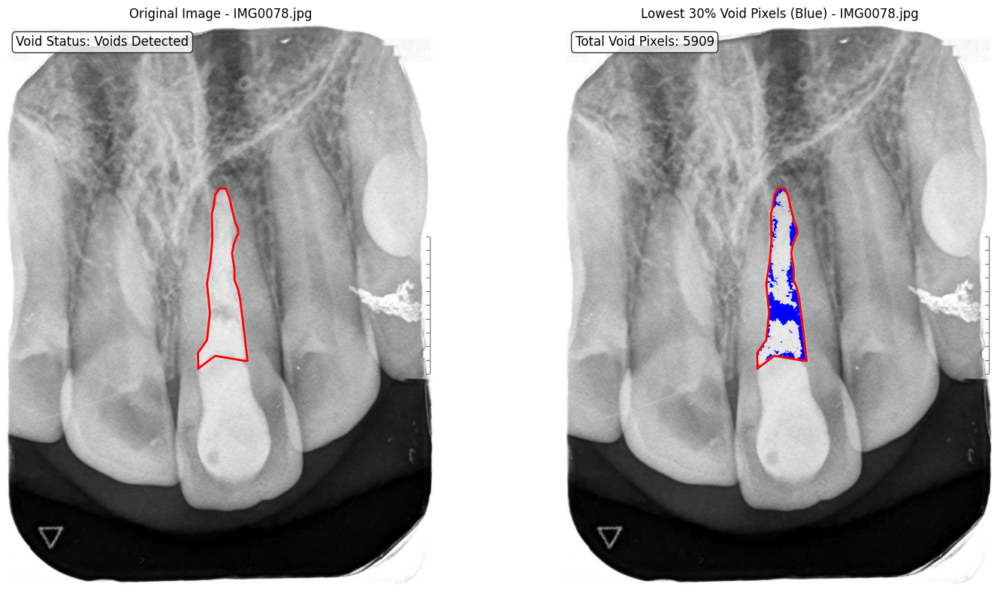

Image: IMG0079.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Present


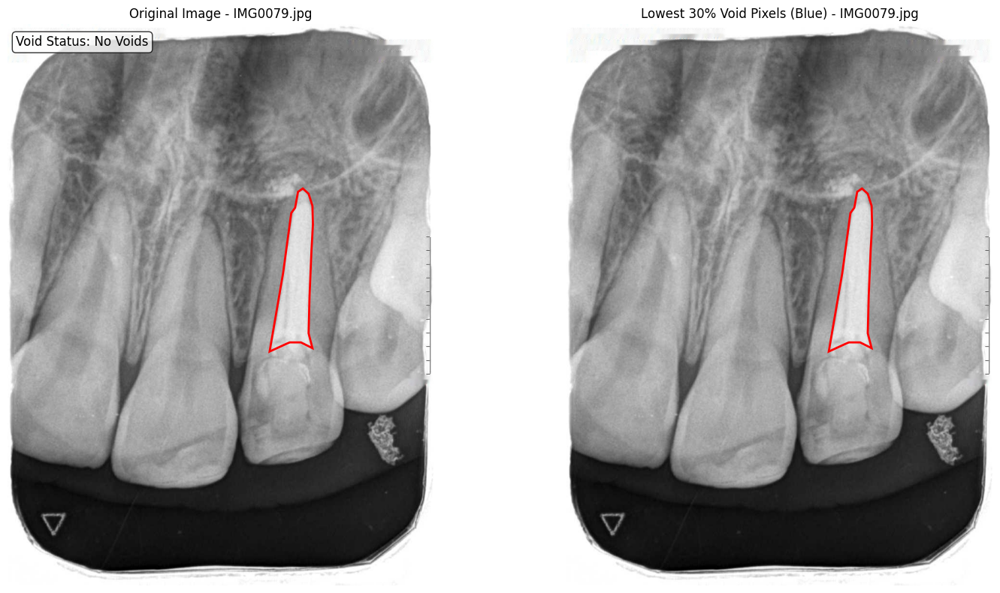

Image: IMG0080.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


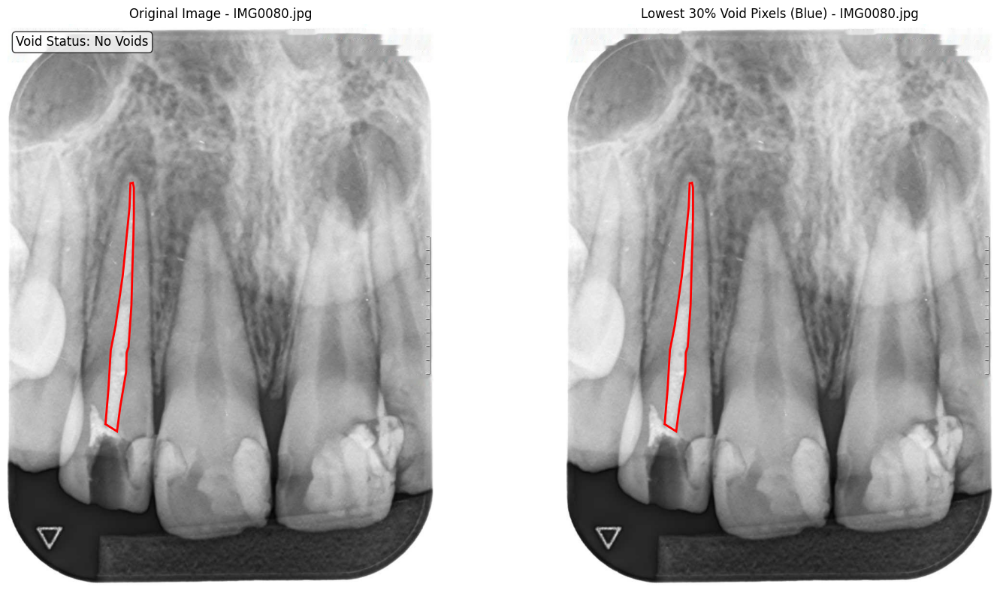

Image: IMG0081.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


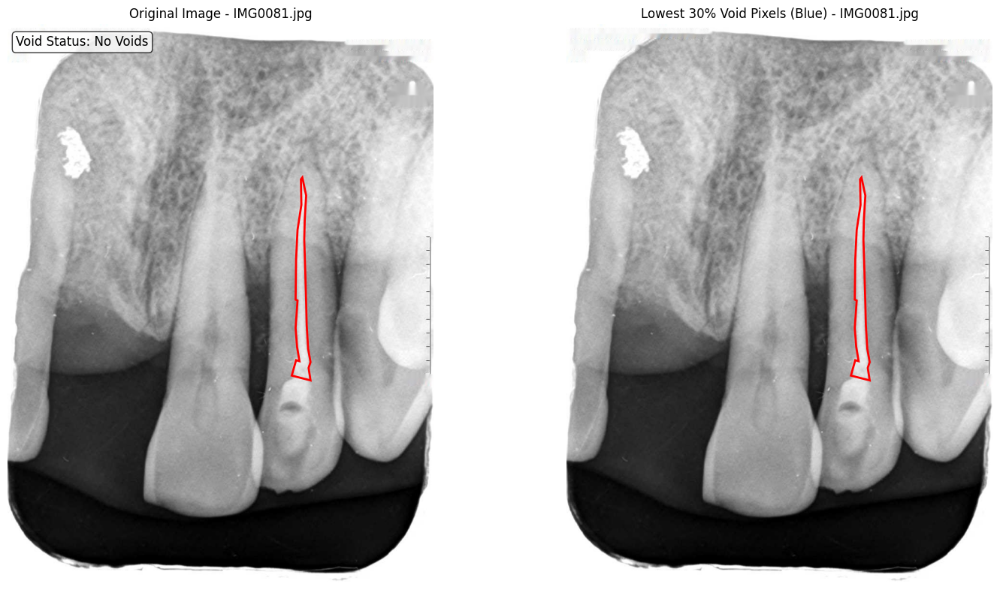

Image: IMG0085.jpg | Filling ID: 3 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


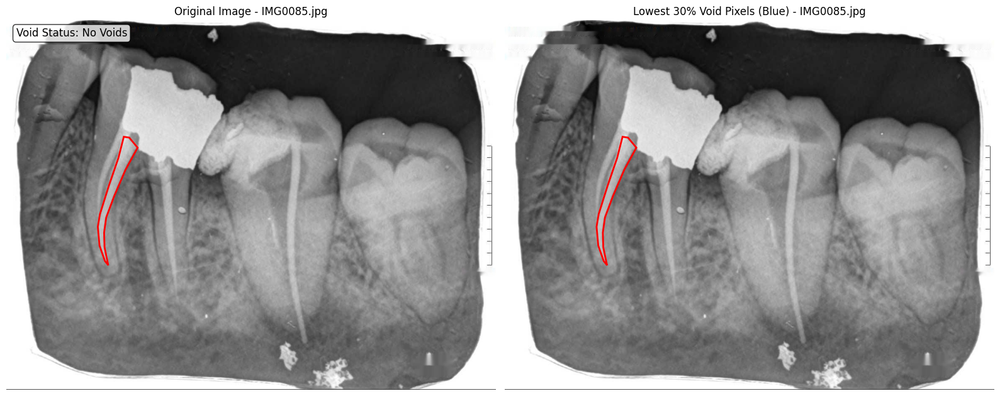

Image: IMG0085.jpg | Filling ID: 4 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


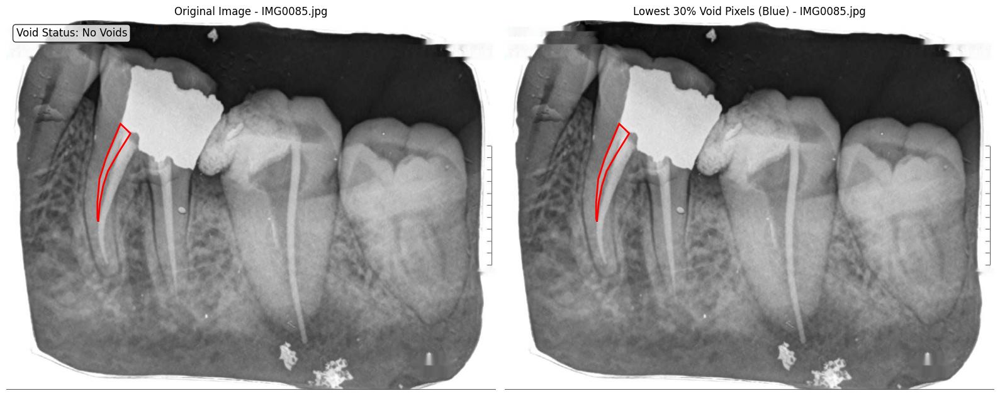

Image: IMG0085.jpg | Filling ID: 5 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


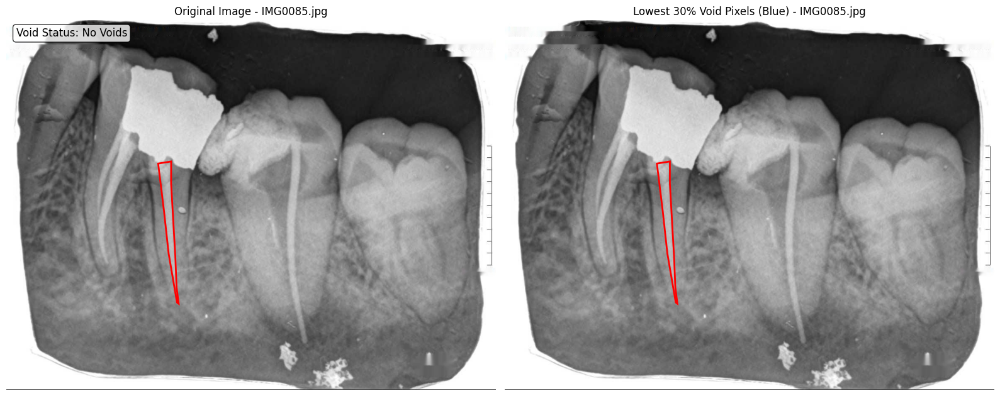

Image: IMG0086.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


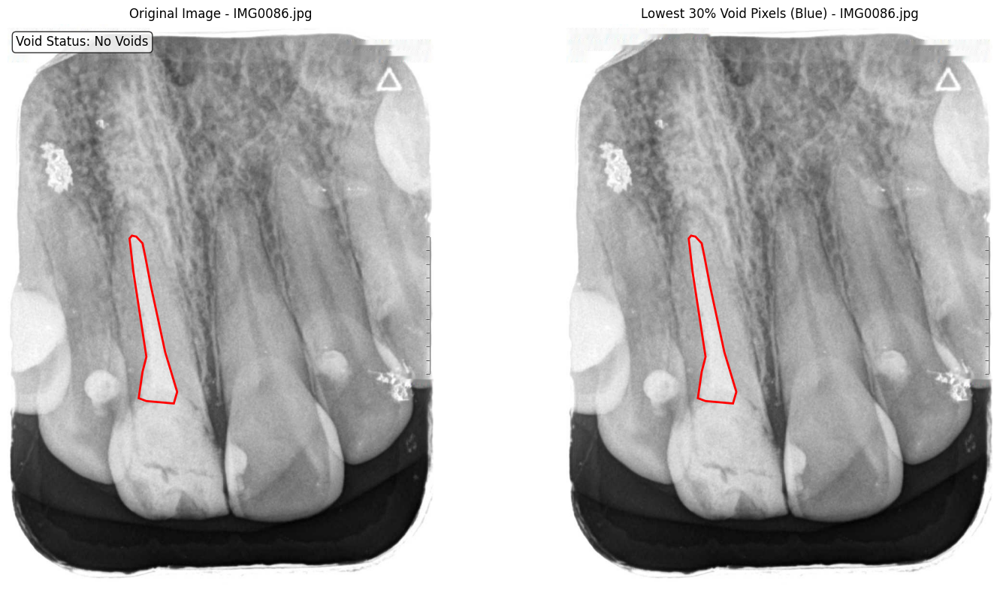

Image: IMG0103.jpg | Filling ID: 2 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


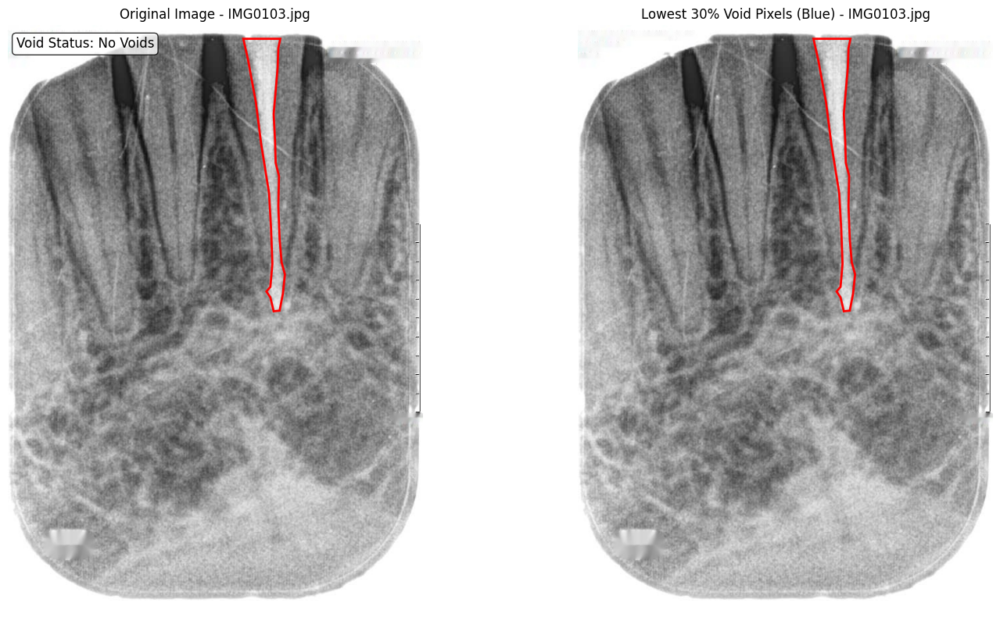

Image: IMG0107.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


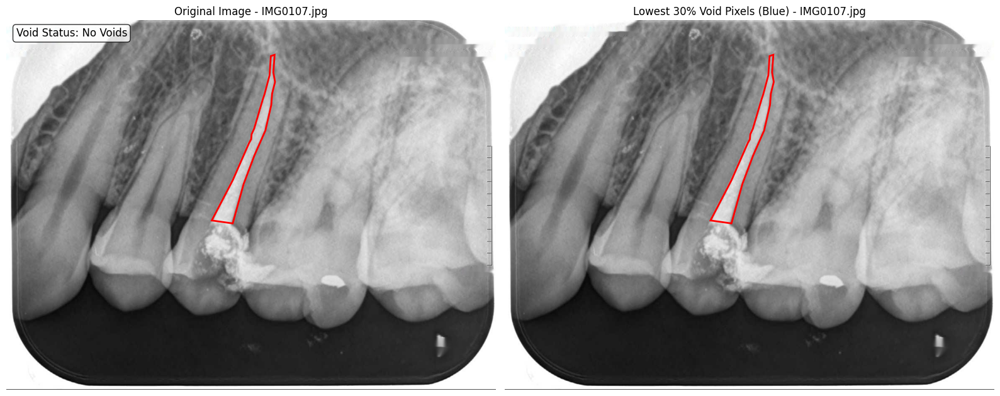

Image: IMG0110.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


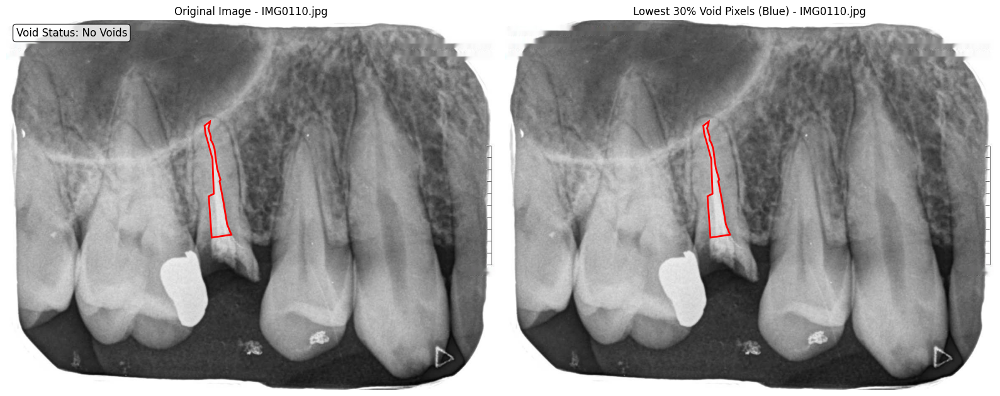

Image: IMG0115.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


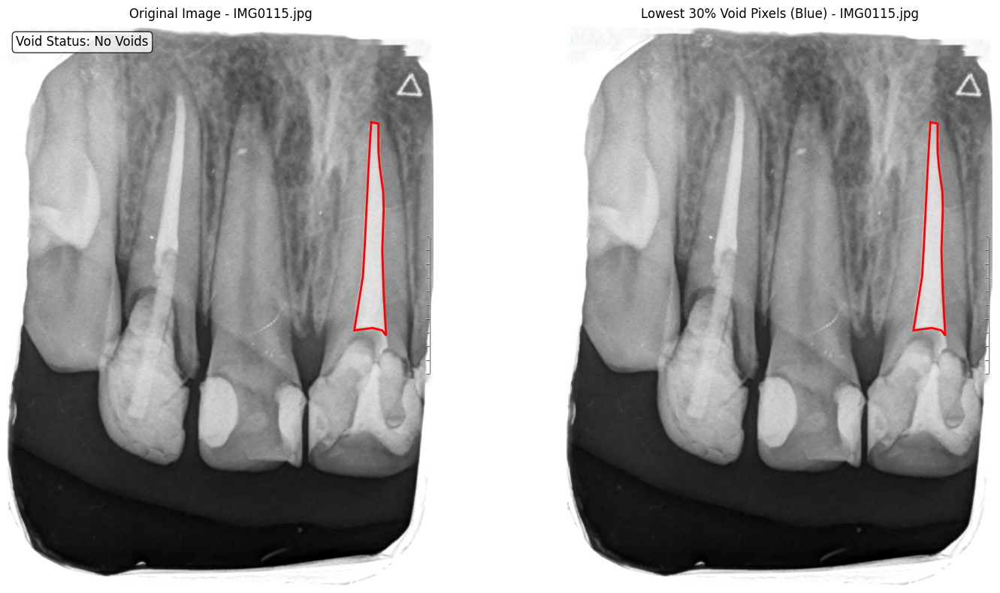

Image: IMG0116.jpg | Filling ID: 1 | Status: Voids Detected | Void Pixels: 15029 | Ground Truth: Present


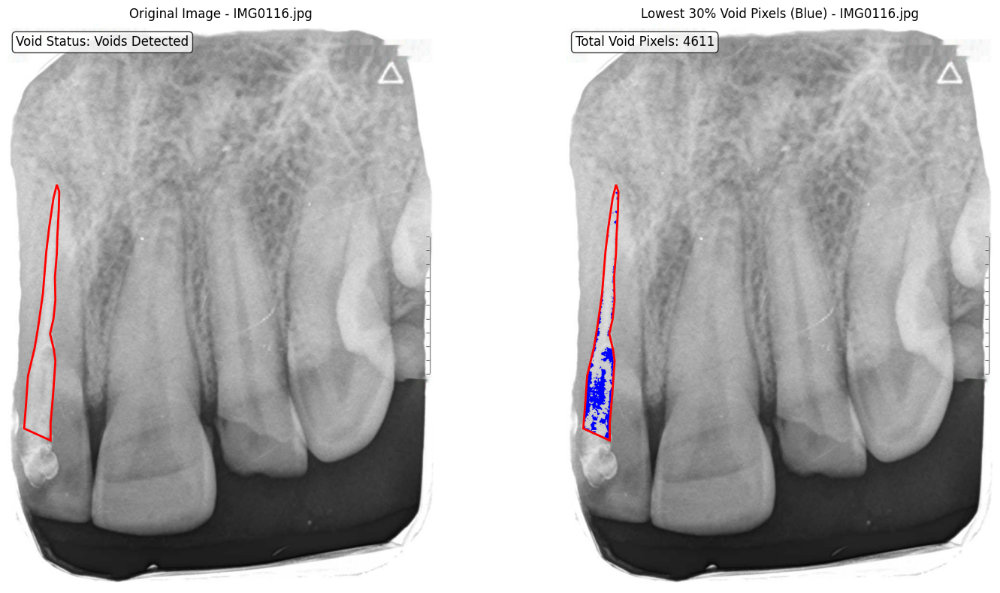

Image: IMG0117.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


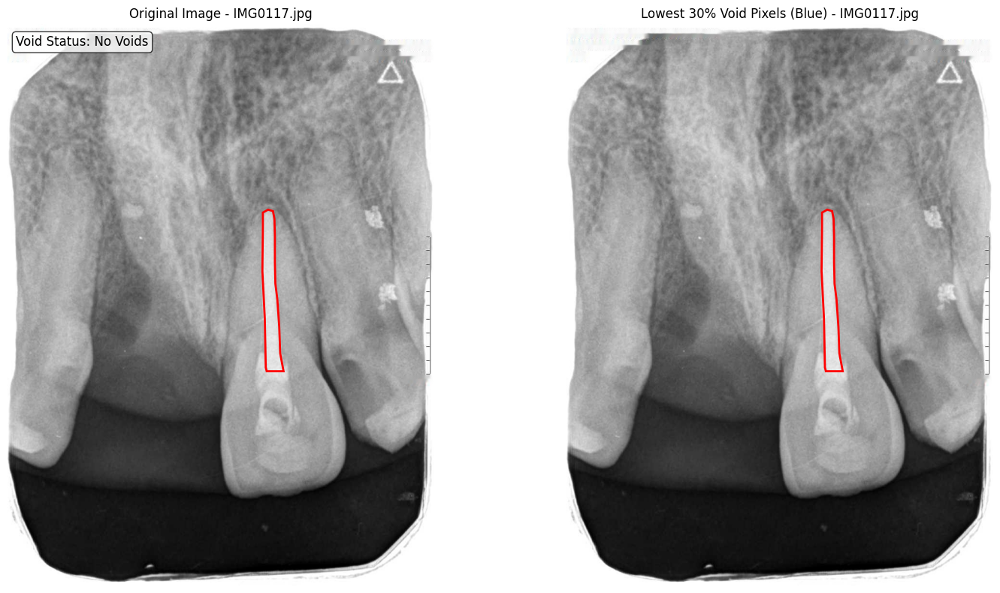

Image: IMG0120.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


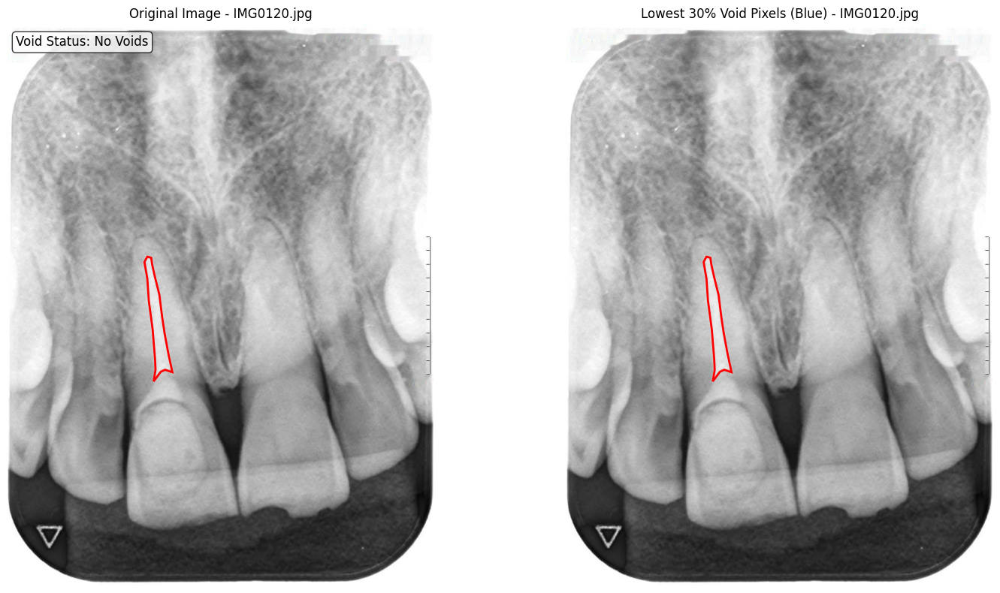

Image: IMG0121.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Present


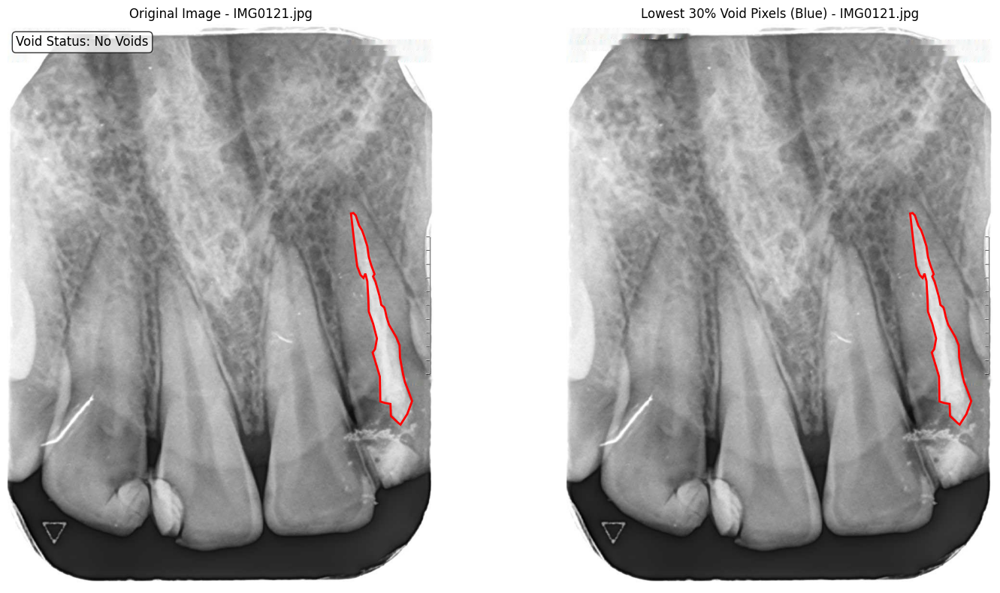

Image: IMG0122.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


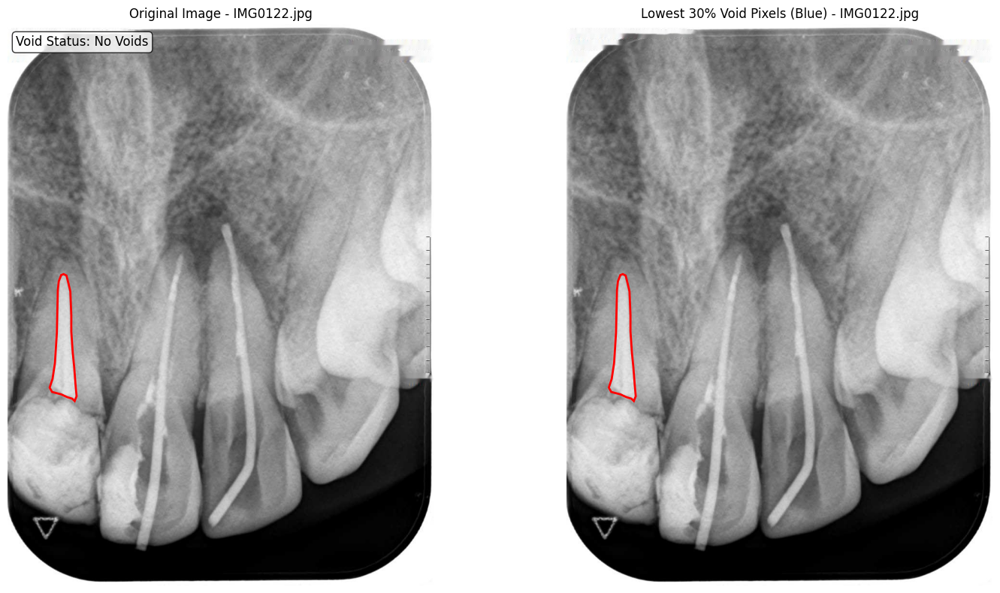

Image: IMG0123.jpg | Filling ID: 1 | Status: Voids Detected | Void Pixels: 7842 | Ground Truth: Absent


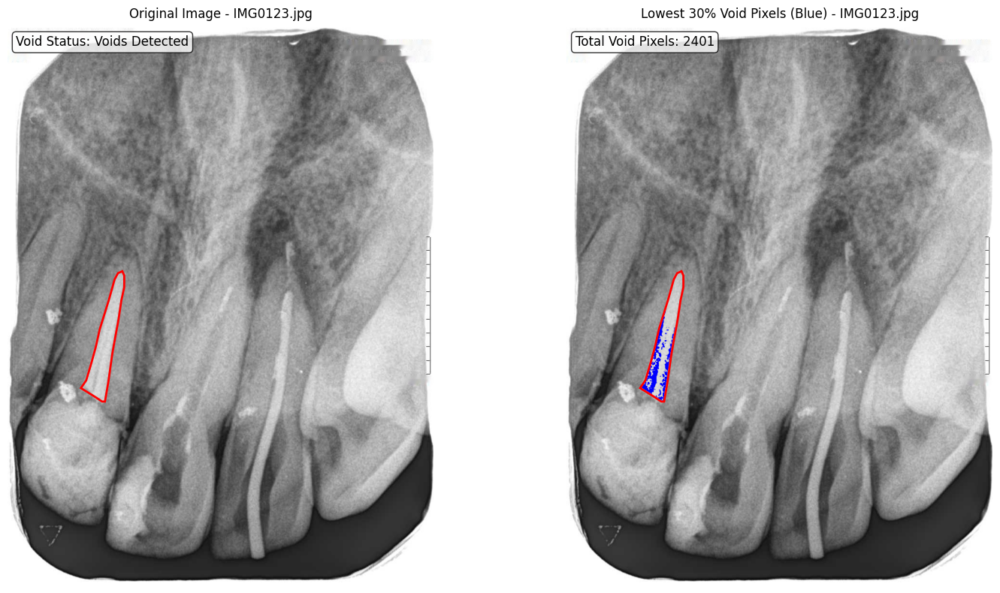

Image: IMG0124.jpg | Filling ID: 1 | Status: Voids Detected | Void Pixels: 5883 | Ground Truth: Absent


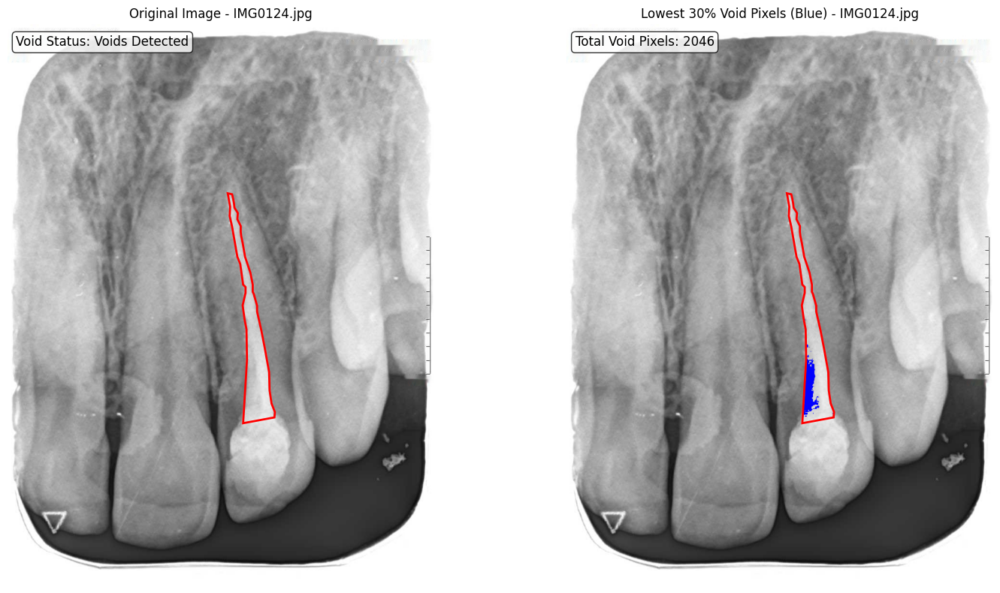

Image: IMG0125.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


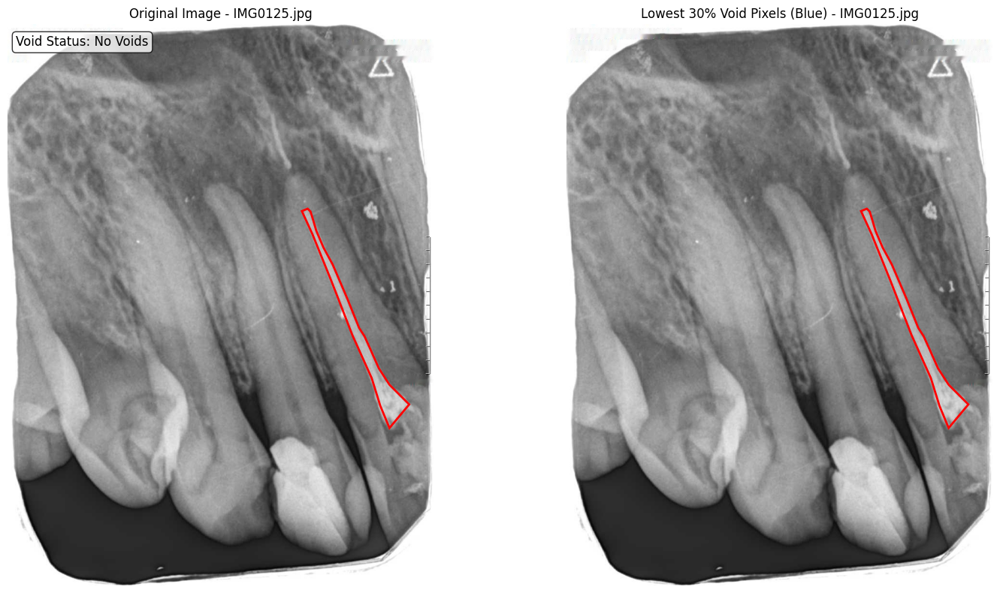

Image: IMG0126.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


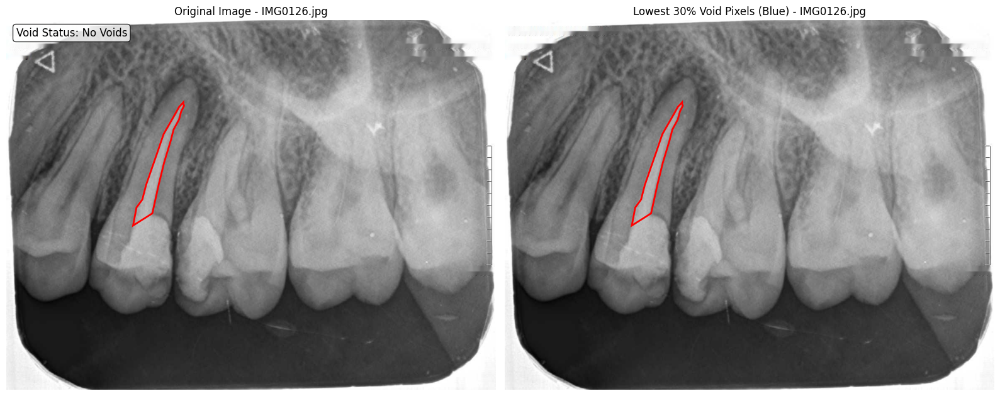

Image: IMG0127.jpg | Filling ID: 2 | Status: Voids Detected | Void Pixels: 29917 | Ground Truth: Absent


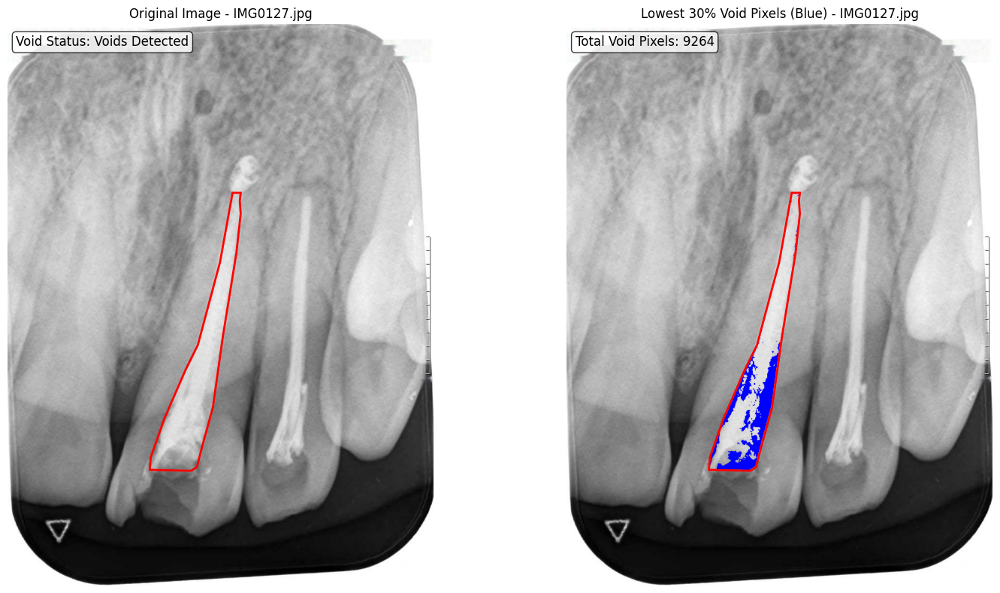

Image: IMG0127.jpg | Filling ID: 3 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


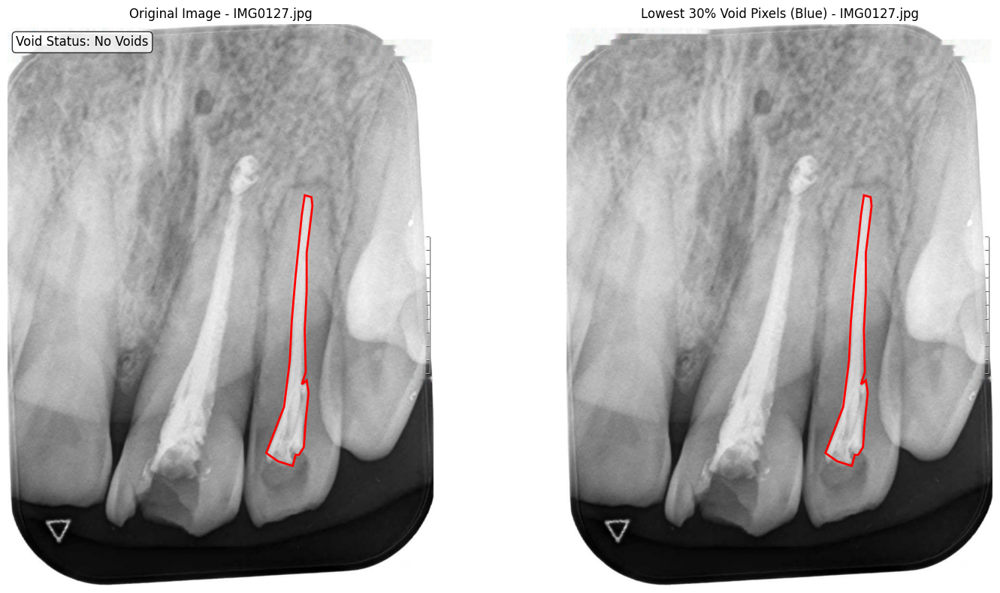

Image: IMG0128.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


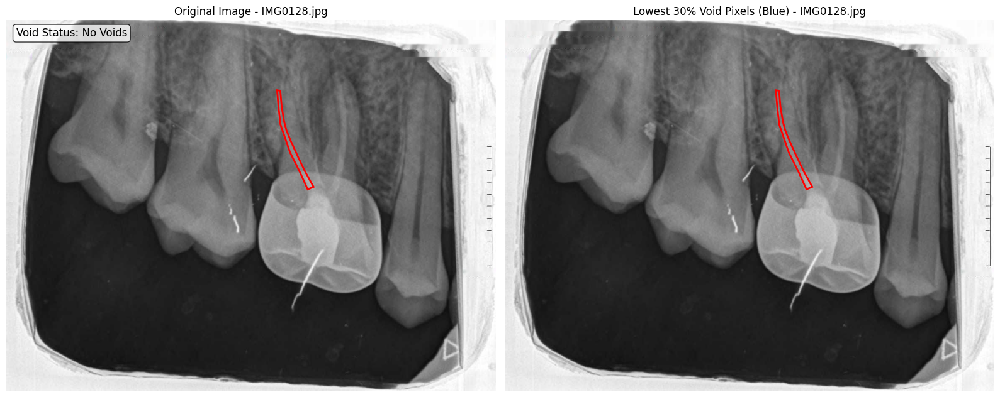

Image: IMG0128.jpg | Filling ID: 2 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


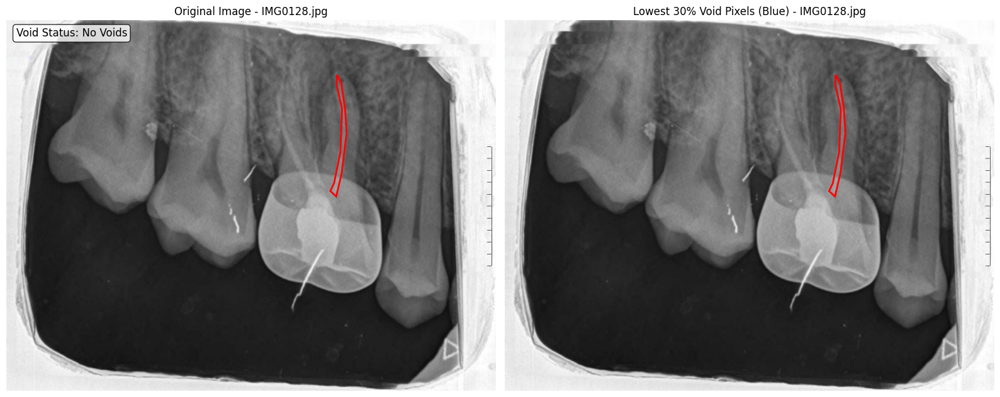

Image: IMG0128.jpg | Filling ID: 3 | Status: No Voids | Void Pixels: 2338 | Ground Truth: Absent


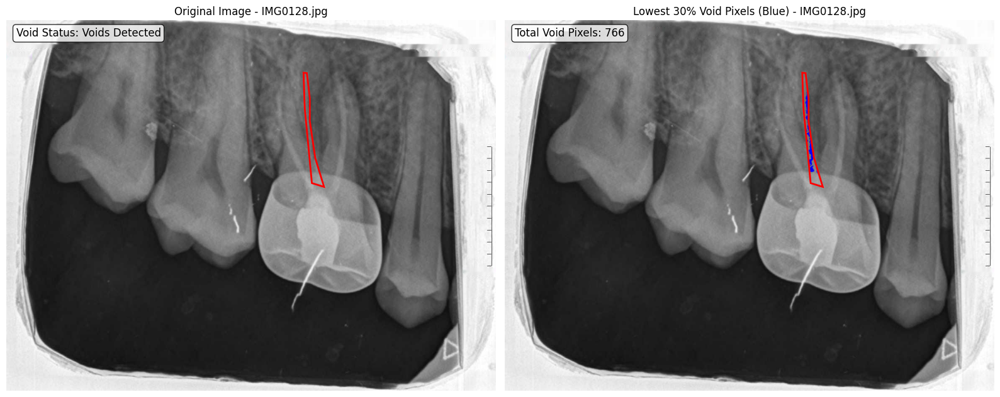

Image: IMG0130.jpg | Filling ID: 1 | Status: No Voids | Void Pixels: 0 | Ground Truth: Absent


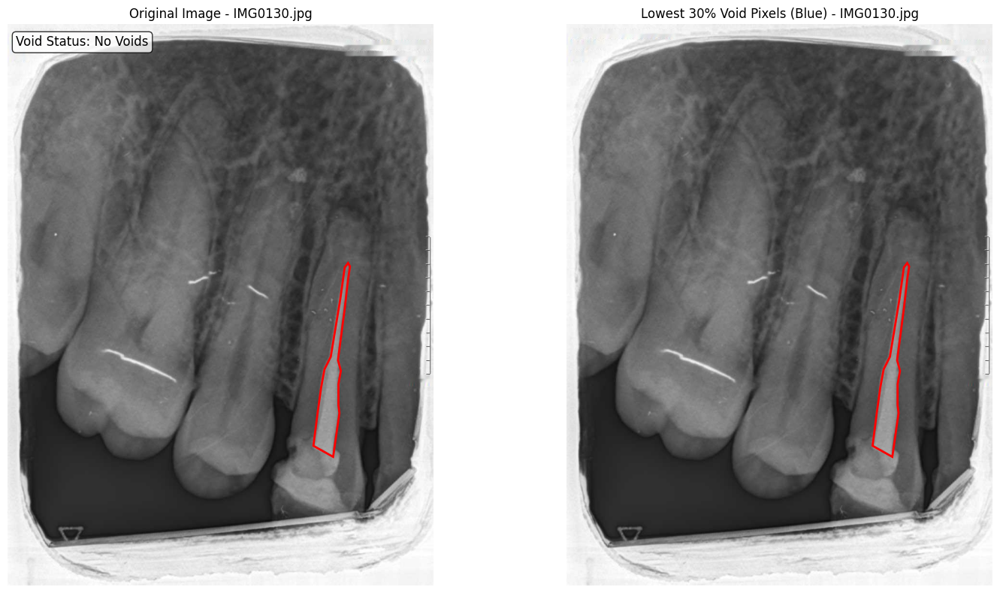


DETAILED COMPARISON (Predicted vs Ground Truth)
✓ IMG0018.jpg | Filling 2 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0018.jpg | Filling 3 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0078.jpg | Filling 1 | Predicted: Present | Ground Truth: Present | Void Pixels: 19103
✗ IMG0079.jpg | Filling 1 | Predicted: Absent | Ground Truth: Present | Void Pixels: 0
✓ IMG0080.jpg | Filling 1 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0081.jpg | Filling 1 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0085.jpg | Filling 3 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0085.jpg | Filling 4 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0085.jpg | Filling 5 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0086.jpg | Filling 1 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 0
✓ IMG0103.jpg | Filling 2 | Predicted: Absent | Ground Truth: Absent | Void Pixels: 

In [1]:
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import matplotlib.patches as patches
from typing import List, Tuple, Dict, Any
import math
from collections import defaultdict

# Configuration
VOIDS_THRESHOLD_PERCENT = 57.0  # Configurable threshold for void detection (60)
VISUALIZE_PLOTS = True  # Set to True to visualize the plots
VISUALIZE_ONLY_WRONG_PREDS = False

def load_annotations(json_file: str) -> List[Dict[str, Any]]:
    """Load the annotation JSON file."""
    with open(json_file, 'r') as f:
        data = json.load(f)
    return data

def parse_coordinates(annotations: List[int]) -> List[Tuple[int, int]]:
    """Parse flat list of coordinates into [x, y] pairs."""
    coordinates = []
    for i in range(0, len(annotations), 2):
        if i + 1 < len(annotations):
            coordinates.append((annotations[i], annotations[i + 1]))
    return coordinates

def detect_voids(image_path: str, filling_coords: List[Tuple[int, int]], threshold_percentage: float = 20.0) -> Tuple[bool, int, np.ndarray]:
    """
    Detect voids in root canal fillings based on low-intensity pixels surrounded by high-intensity pixels.
    
    Args:
        image_path: Path to the image file
        filling_coords: List of (x, y) tuples representing the polygon coordinates of the root canal filling
        threshold_percentage: Percentage of the filling's intensity range to set as threshold
        
    Returns:
        Tuple containing:
        - Boolean indicating whether voids are detected
        - Count of void pixels
        - Masked image array where only the filling area is visible and void pixels are highlighted
    """
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"Could not load image: {image_path}")
    
    # Apply CLAHE for preprocessing
    clahe_image = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8)).apply(image)

    x = 1.43 # 1.46
    custom_kernel = np.array([
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05,  x, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05]
    ], dtype=np.float32)
    
    # Apply custom kernel convolution
    enhanced_image = cv2.filter2D(clahe_image, -1, custom_kernel)
    
    # Create binary mask for the filling polygon
    mask = np.zeros_like(image, dtype=np.uint8)
    filling_coords_array = np.array(filling_coords, dtype=np.int32)
    cv2.fillPoly(mask, [filling_coords_array], 255)
    
    # Extract pixel intensities only from the masked filling area
    masked_filling = enhanced_image * (mask > 0).astype(np.uint8)
    
    # Calculate dynamic threshold based only on the filling area
    filling_pixels = enhanced_image[mask != 0]
    if len(filling_pixels) == 0:
        # Create empty masked image for return
        masked_image = np.zeros_like(enhanced_image)
        return False, 0, masked_image
    
    min_intensity = float(np.min(filling_pixels))
    max_intensity = float(np.max(filling_pixels))
    filling_intensity_range = max_intensity - min_intensity
    void_threshold = min_intensity + (filling_intensity_range * threshold_percentage / 100.0)
    
    # Create a more sophisticated void detection that looks for low-intensity regions
    # surrounded by high-intensity pixels within the filling area
    
    # Step 1: Exclude 2-pixel band from the edge of the filling
    # Create an eroded mask to exclude edge pixels
    edge_exclusion_kernel = np.ones((5, 5), np.uint8)
    eroded_filling_mask = cv2.erode(mask, edge_exclusion_kernel, iterations=1)
    
    # Step 2: Apply 5x5 preprocessing mask to enhance voids
    # Use a 5x5 morphological operation to enhance void detection
    # Create a 5x5 kernel for void enhancement
    void_enhancement_kernel = np.ones((5, 5), np.uint8)
    
    # Apply morphological opening to enhance voids (erosion followed by dilation)
    # This helps to identify low-intensity regions more clearly
    enhanced_image = cv2.morphologyEx(enhanced_image, cv2.MORPH_OPEN, void_enhancement_kernel)
    
    # Step 3: Identify potential void pixels (low intensity) only in the core filling area
    potential_void_mask = (enhanced_image < void_threshold) & (eroded_filling_mask != 0)
    
    # Step 4: Create a kernel for morphological operations to find surrounded regions
    kernel = np.ones((3, 3), np.uint8)
    
    # Step 5: Dilate the potential void mask to find regions that are surrounded
    dilated_void_mask = cv2.dilate(potential_void_mask.astype(np.uint8), kernel, iterations=2)
    
    # Step 6: Erode the dilated mask to find the core void regions
    eroded_void_mask = cv2.erode(dilated_void_mask, kernel, iterations=2)
    
    # Step 7: Apply the eroded mask only within the core filling area (excluding edges)
    final_void_mask = (eroded_void_mask > 0) & (eroded_filling_mask != 0)
    
    # Step 8: Additional check - ensure void regions are surrounded by higher intensity pixels
    # Create a larger kernel for checking surrounding pixels
    large_kernel = np.ones((5, 5), np.uint8)
    surrounding_mask = cv2.dilate(final_void_mask.astype(np.uint8), large_kernel, iterations=1)
    surrounding_mask = (surrounding_mask > 0) & (eroded_filling_mask != 0) & (~final_void_mask)
    
    # Calculate average intensity of surrounding pixels
    if np.sum(surrounding_mask) > 0:
        surrounding_intensity = float(np.mean(enhanced_image[surrounding_mask]))
        void_intensity = float(np.mean(enhanced_image[final_void_mask])) if np.sum(final_void_mask) > 0 else 0
        
        # Only consider it a void if surrounding pixels are significantly brighter
        intensity_difference_threshold = filling_intensity_range * 0.15  # 15% of intensity range
        if surrounding_intensity - void_intensity < intensity_difference_threshold:
            final_void_mask = np.zeros_like(final_void_mask)
    
    # Step 9: Check for significant concentration of void pixels
    # Count void pixels
    void_pixels = int(np.sum(final_void_mask))
    
    # Calculate the percentage of void pixels relative to the core filling area
    core_filling_pixels = int(np.sum(eroded_filling_mask != 0))
    void_percentage = (void_pixels / core_filling_pixels * 100) if core_filling_pixels > 0 else 0
    
    # Define threshold for significant void concentration (e.g., 5% of core filling area)
    significant_void_threshold = 25.0  # 25% of core filling area
    
    # Only consider it a void if there's a significant concentration
    if void_percentage < significant_void_threshold:
        final_void_mask = np.zeros_like(final_void_mask)
        void_pixels = 0
    
    # Create masked image for visualization
    masked_image = np.zeros_like(enhanced_image)
    # Copy filling area
    masked_image[mask != 0] = enhanced_image[mask != 0]
    # Highlight void pixels (set to low value like 50)
    masked_image[final_void_mask] = 50
    
    # Return results
    voids_detected = void_pixels > 0
    return voids_detected, void_pixels, masked_image

def get_ground_truth_void_label(filling_annotation: Dict[str, Any]) -> str:
    """Extract ground truth void label from the annotation."""
    ground_truth = filling_annotation.get("voids", "").strip()
    
    # Map ground truth labels to our classification categories
    if ground_truth.lower() in ["present", "yes", "true", "1"]:
        return "Present"
    elif ground_truth.lower() in ["absent", "no", "false", "0"]:
        return "Absent"
    else:
        return "Unknown"  # For cases where ground truth is not available

def calculate_void_metrics(predictions: List[str], ground_truths: List[str]) -> Dict[str, float]:
    """
    Calculate precision, recall, and F1-score for void detection.
    """
    classes = ["Present", "Absent"]
    metrics = {}
    
    for class_name in classes:
        # True Positives: predicted as class and actually class
        tp = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred == class_name and gt == class_name)
        
        # False Positives: predicted as class but actually not class
        fp = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred == class_name and gt != class_name)
        
        # False Negatives: not predicted as class but actually class
        fn = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred != class_name and gt == class_name)
        
        # Calculate metrics
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        metrics[class_name] = {
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'tp': tp,
            'fp': fp,
            'fn': fn
        }
    
    # Overall accuracy
    correct_predictions = sum(1 for pred, gt in zip(predictions, ground_truths) if pred == gt)
    total_predictions = len(predictions)
    overall_accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
    
    metrics['overall'] = {
        'accuracy': overall_accuracy,
        'total_predictions': total_predictions,
        'correct_predictions': correct_predictions
    }
    
    return metrics

def visualize_void_analysis(image_path: str, filling_coords: List[Tuple[int, int]], 
                           void_result: Tuple[bool, int, np.ndarray], 
                           analysis_result: Dict[str, Any], image_name: str, clahe_image: np.ndarray = None):
    """
    Create a visualization of the void analysis results.
    """
    try:
        # Load original image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Warning: Could not load image {image_path}")
            return
        
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create figure with subplots
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
        
        # Original image with filling outline
        ax1.imshow(image_rgb)
        
        # Draw filling polygon
        filling_poly = patches.Polygon(filling_coords, closed=True, 
                                     fill=False, edgecolor='red', linewidth=2)
        ax1.add_patch(filling_poly)
        
        # Add text with void detection results
        voids_detected, void_pixels, masked_image = void_result
        void_status = "Voids Detected" if voids_detected else "No Voids"
        ax1.text(0.02, 0.98, f"Void Status: {void_status}", 
                transform=ax1.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        ax1.set_title(f"Original Image - {image_name}")
        ax1.axis('off')
        
        # Create visualization showing only the lowest 40% of void pixels in blue
        # Start with the original image
        void_visualization = image_rgb.copy()
        
        # Only show the very low pixel intensities (void pixels) in blue
        if voids_detected:
            # Find void pixels (value 50 in masked_image)
            void_mask = (masked_image == 50)
            
            if np.sum(void_mask) > 0:
                # Get the original pixel intensities of void regions
                void_intensities = clahe_image[void_mask]
                
                # Calculate the threshold for bottom 40% of void pixels
                sorted_intensities = np.sort(void_intensities)
                bottom_30_percent_index = int(len(sorted_intensities) * 0.3)
                if bottom_30_percent_index > 0:
                    intensity_threshold = sorted_intensities[bottom_30_percent_index]
                else:
                    intensity_threshold = np.max(void_intensities)
                
                # Create mask for only the lowest 30% intensity void pixels
                lowest_30_percent_mask = void_mask & (clahe_image <= intensity_threshold)
                
                # Highlight the lowest 30% void pixels in blue
                void_visualization[lowest_30_percent_mask] = [0, 0, 255]  # Blue color
        
        # Display the visualization
        ax2.imshow(void_visualization)
        
        # Overlay filling outline
        filling_poly_void = patches.Polygon(filling_coords, closed=True, 
                                          fill=False, edgecolor='red', linewidth=2)
        ax2.add_patch(filling_poly_void)
        
        # Add void pixel count as text
        if voids_detected:
            lowest_30_count = int(np.sum(lowest_30_percent_mask)) if 'lowest_30_percent_mask' in locals() else 0
            ax2.text(0.02, 0.98, f"Total Void Pixels: {lowest_30_count}", 
                    transform=ax2.transAxes, fontsize=12,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        
        ax2.set_title(f"Lowest 30% Void Pixels (Blue) - {image_name}")
        ax2.axis('off')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Warning: Could not create visualization for {image_name}: {str(e)}")

def main():
    """Main function to analyze void detection in root canal fillings."""
    json_file = "annotated_and_labeled_29.json"
    image_dir = "annotated_and_labeled"
    
    # Load annotations
    data = load_annotations(json_file)
    print(f"Loaded {len(data)} entries from {json_file}")
    print("\n" + "="*80)
    print("VOID DETECTION ANALYSIS RESULTS")
    print("="*80)
    
    total_fillings = 0
    void_detection_counts = {"Present": 0, "Absent": 0}
    
    # Lists to store predictions and ground truths for comparison
    all_predictions = []
    all_ground_truths = []
    comparison_data = []
    
    for entry in data:
        image_name = entry.get("image_name", "Unknown")
        annotations = entry.get("annotation", [])
        
        # Separate fillings
        fillings = []
        
        for ann in annotations:
            if ann.get("name") == "Filling" and ann.get("shape") == "polygon":
                coords = parse_coordinates(ann.get("annotations", []))
                if len(coords) >= 3:  # Need at least 3 points for a polygon
                    fillings.append({
                        'id': ann.get("id", 0),
                        'coords': coords,
                        'annotation': ann  # Keep the original annotation for ground truth
                    })
        
        # Skip if no fillings
        if not fillings:
            print(f"Image: {image_name} | Skipped: No fillings found")
            continue
        
        # Analyze each filling for voids
        for filling in fillings:
            try:
                image_path = os.path.join(image_dir, image_name)
                if not os.path.exists(image_path):
                    print(f"Image: {image_name} | Error: Image file not found")
                    continue
                
                # Detect voids
                voids_detected, void_pixels, masked_image = detect_voids(
                    image_path, filling['coords'], VOIDS_THRESHOLD_PERCENT
                )
                
                # Get the CLAHE image for visualization
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                clahe_image = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8)).apply(image)
                
                # Determine prediction
                prediction = "Present" if (voids_detected and void_pixels > 3000) else "Absent"
                
                # Get ground truth label
                ground_truth = get_ground_truth_void_label(filling['annotation'])
                
                # Store for comparison
                if ground_truth != "Unknown":
                    all_predictions.append(prediction)
                    all_ground_truths.append(ground_truth)
                    comparison_data.append({
                        'image_name': image_name,
                        'filling_id': filling['id'],
                        'predicted': prediction,
                        'ground_truth': ground_truth,
                        'void_pixels': void_pixels
                    })
                
                # Print results with ground truth comparison
                status = "Voids Detected" if (voids_detected and void_pixels > 3000) else "No Voids"
                print(f"Image: {image_name} | Filling ID: {filling['id']} | Status: {status} | Void Pixels: {void_pixels} | Ground Truth: {ground_truth}")
                
                # Update counts
                void_detection_counts[prediction] += 1
                total_fillings += 1
                
                # Optional: Create visualization
                if os.path.exists(image_path) and VISUALIZE_PLOTS:
                    # Create a simple analysis result dict for visualization
                    analysis_result = {
                        'filling_id': filling['id'],
                        'voids_detected': voids_detected,
                        'void_pixels': void_pixels
                    }
                    visualize_void_analysis(image_path, filling['coords'], 
                                         (voids_detected, void_pixels, masked_image), 
                                         analysis_result, image_name, clahe_image)
                
            except Exception as e:
                print(f"Image: {image_name} | Filling ID: {filling['id']} | Error: {str(e)}")
    
    # Calculate metrics
    if all_predictions and all_ground_truths:
        metrics = calculate_void_metrics(all_predictions, all_ground_truths)
        
        # Print detailed comparison
        print("\n" + "="*80)
        print("DETAILED COMPARISON (Predicted vs Ground Truth)")
        print("="*80)
        
        correct_predictions = 0
        for item in comparison_data:
            status = "✓" if item['predicted'] == item['ground_truth'] else "✗"
            correct_predictions += 1 if item['predicted'] == item['ground_truth'] else 0
            print(f"{status} {item['image_name']} | Filling {item['filling_id']} | Predicted: {item['predicted']} | Ground Truth: {item['ground_truth']} | Void Pixels: {item['void_pixels']}")
        
        print(f"\nCorrect Predictions: {correct_predictions}/{len(comparison_data)}")
        
        # Print metrics
        print("\n" + "="*80)
        print("VOID DETECTION PERFORMANCE METRICS")
        print("="*80)
        
        for class_name in ["Present", "Absent"]:
            if class_name in metrics:
                class_metrics = metrics[class_name]
                print(f"\n{class_name}:")
                print(f"  Precision: {class_metrics['precision']:.3f} ({class_metrics['tp']}/({class_metrics['tp']}+{class_metrics['fp']}))")
                print(f"  Recall: {class_metrics['recall']:.3f} ({class_metrics['tp']}/({class_metrics['tp']}+{class_metrics['fn']}))")
                print(f"  F1-Score: {class_metrics['f1_score']:.3f}")
        
        overall = metrics['overall']
        print(f"\nOverall Accuracy: {overall['accuracy']:.3f} ({overall['correct_predictions']}/{overall['total_predictions']})")
    
    # Print summary
    print("\n" + "="*80)
    print("VOID DETECTION SUMMARY")
    print("="*80)
    print(f"Total fillings analyzed: {total_fillings}")
    print(f"Voids detected: {void_detection_counts['Present']}")
    print(f"No voids detected: {void_detection_counts['Absent']}")
    
    if total_fillings > 0:
        print(f"\nPercentage breakdown:")
        print(f"Voids Present: {(void_detection_counts['Present']/total_fillings)*100:.1f}%")
        print(f"Voids Absent: {(void_detection_counts['Absent']/total_fillings)*100:.1f}%")
    
    print(f"\nVoid Detection Threshold: {VOIDS_THRESHOLD_PERCENT}%")

if __name__ == "__main__":
    main() 

Starting Hyperparameter Tuning for Void Detection (F1-Score Optimization)
Testing 209 parameter combinations...
Progress: 1/209 - Testing threshold=50, kernel_center=1.32
  → New best F1-Score: 0.2282
Progress: 2/209 - Testing threshold=50, kernel_center=1.33
Progress: 3/209 - Testing threshold=50, kernel_center=1.34
Progress: 4/209 - Testing threshold=50, kernel_center=1.35
Progress: 5/209 - Testing threshold=50, kernel_center=1.36
  → New best F1-Score: 0.2597
Progress: 6/209 - Testing threshold=50, kernel_center=1.37
  → New best F1-Score: 0.2778
Progress: 7/209 - Testing threshold=50, kernel_center=1.38
Progress: 8/209 - Testing threshold=50, kernel_center=1.39
Progress: 9/209 - Testing threshold=50, kernel_center=1.40
Progress: 10/209 - Testing threshold=50, kernel_center=1.41
Progress: 11/209 - Testing threshold=50, kernel_center=1.42
Progress: 12/209 - Testing threshold=50, kernel_center=1.43
Progress: 13/209 - Testing threshold=50, kernel_center=1.44
Progress: 14/209 - Testing 

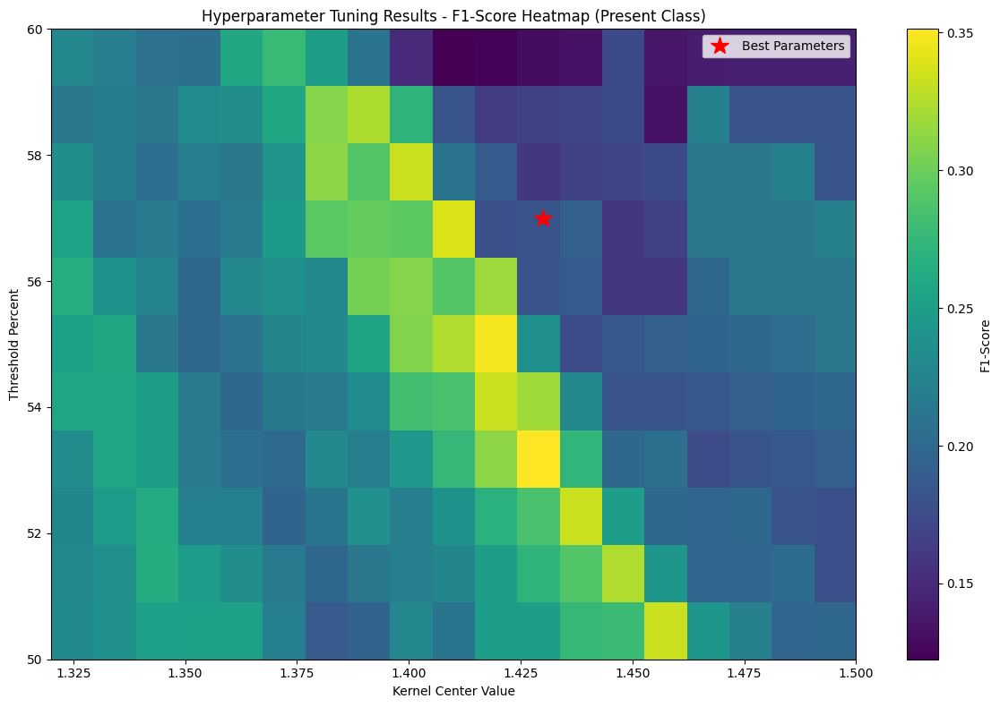


Results saved to 'hyperparameter_tuning_f1_results.png'
Best parameters to use in check_voids.py:
  VOIDS_THRESHOLD_PERCENT = 57
  custom_kernel center value = 1.43


In [7]:
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import matplotlib.patches as patches
from typing import List, Tuple, Dict, Any
import math
from collections import defaultdict
import itertools

# Configuration
VISUALIZE_PLOTS = False  # Set to False for hyperparameter tuning
VISUALIZE_ONLY_WRONG_PREDS = False

def load_annotations(json_file: str) -> List[Dict[str, Any]]:
    """Load the annotation JSON file."""
    with open(json_file, 'r') as f:
        data = json.load(f)
    return data

def parse_coordinates(annotations: List[int]) -> List[Tuple[int, int]]:
    """Parse flat list of coordinates into [x, y] pairs."""
    coordinates = []
    for i in range(0, len(annotations), 2):
        if i + 1 < len(annotations):
            coordinates.append((annotations[i], annotations[i + 1]))
    return coordinates

def detect_voids_with_params(image_path: str, filling_coords: List[Tuple[int, int]], 
                           threshold_percentage: float, kernel_center: float) -> Tuple[bool, int, np.ndarray]:

    """
    Detect voids in root canal fillings based on low-intensity pixels surrounded by high-intensity pixels.
    
    Args:
        image_path: Path to the image file
        filling_coords: List of (x, y) tuples representing the polygon coordinates of the root canal filling
        threshold_percentage: Percentage of the filling's intensity range to set as threshold
        
    Returns:
        Tuple containing:
        - Boolean indicating whether voids are detected
        - Count of void pixels
        - Masked image array where only the filling area is visible and void pixels are highlighted
    """
    # Load the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise ValueError(f"Could not load image: {image_path}")
    
    # Apply CLAHE for preprocessing
    clahe_image = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8)).apply(image)

    custom_kernel = np.array([
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05,  kernel_center, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05],
        [-0.05, -0.05, -0.05, -0.05, -0.05]
    ], dtype=np.float32)
    
    # Apply custom kernel convolution
    enhanced_image = cv2.filter2D(clahe_image, -1, custom_kernel)
    
    # Create binary mask for the filling polygon
    mask = np.zeros_like(image, dtype=np.uint8)
    filling_coords_array = np.array(filling_coords, dtype=np.int32)
    cv2.fillPoly(mask, [filling_coords_array], 255)
    
    # Extract pixel intensities only from the masked filling area
    masked_filling = enhanced_image * (mask > 0).astype(np.uint8)
    
    # Calculate dynamic threshold based only on the filling area
    filling_pixels = enhanced_image[mask != 0]
    if len(filling_pixels) == 0:
        # Create empty masked image for return
        masked_image = np.zeros_like(enhanced_image)
        return False, 0, masked_image
    
    min_intensity = float(np.min(filling_pixels))
    max_intensity = float(np.max(filling_pixels))
    filling_intensity_range = max_intensity - min_intensity
    void_threshold = min_intensity + (filling_intensity_range * threshold_percentage / 100.0)
    
    # Create a more sophisticated void detection that looks for low-intensity regions
    # surrounded by high-intensity pixels within the filling area
    
    # Step 1: Exclude 2-pixel band from the edge of the filling
    # Create an eroded mask to exclude edge pixels
    edge_exclusion_kernel = np.ones((5, 5), np.uint8)
    eroded_filling_mask = cv2.erode(mask, edge_exclusion_kernel, iterations=1)
    
    # Step 2: Apply 5x5 preprocessing mask to enhance voids
    # Use a 5x5 morphological operation to enhance void detection
    # Create a 5x5 kernel for void enhancement
    void_enhancement_kernel = np.ones((5, 5), np.uint8)
    
    # Apply morphological opening to enhance voids (erosion followed by dilation)
    # This helps to identify low-intensity regions more clearly
    enhanced_image = cv2.morphologyEx(enhanced_image, cv2.MORPH_OPEN, void_enhancement_kernel)
    
    # Step 3: Identify potential void pixels (low intensity) only in the core filling area
    potential_void_mask = (enhanced_image < void_threshold) & (eroded_filling_mask != 0)
    
    # Step 4: Create a kernel for morphological operations to find surrounded regions
    kernel = np.ones((3, 3), np.uint8)
    
    # Step 5: Dilate the potential void mask to find regions that are surrounded
    dilated_void_mask = cv2.dilate(potential_void_mask.astype(np.uint8), kernel, iterations=2)
    
    # Step 6: Erode the dilated mask to find the core void regions
    eroded_void_mask = cv2.erode(dilated_void_mask, kernel, iterations=2)
    
    # Step 7: Apply the eroded mask only within the core filling area (excluding edges)
    final_void_mask = (eroded_void_mask > 0) & (eroded_filling_mask != 0)
    
    # Step 8: Additional check - ensure void regions are surrounded by higher intensity pixels
    # Create a larger kernel for checking surrounding pixels
    large_kernel = np.ones((5, 5), np.uint8)
    surrounding_mask = cv2.dilate(final_void_mask.astype(np.uint8), large_kernel, iterations=1)
    surrounding_mask = (surrounding_mask > 0) & (eroded_filling_mask != 0) & (~final_void_mask)
    
    # Calculate average intensity of surrounding pixels
    if np.sum(surrounding_mask) > 0:
        surrounding_intensity = float(np.mean(enhanced_image[surrounding_mask]))
        void_intensity = float(np.mean(enhanced_image[final_void_mask])) if np.sum(final_void_mask) > 0 else 0
        
        # Only consider it a void if surrounding pixels are significantly brighter
        intensity_difference_threshold = filling_intensity_range * 0.15  # 15% of intensity range
        if surrounding_intensity - void_intensity < intensity_difference_threshold:
            final_void_mask = np.zeros_like(final_void_mask)
    
    # Step 9: Check for significant concentration of void pixels
    # Count void pixels
    void_pixels = int(np.sum(final_void_mask))
    
    # Calculate the percentage of void pixels relative to the core filling area
    core_filling_pixels = int(np.sum(eroded_filling_mask != 0))
    void_percentage = (void_pixels / core_filling_pixels * 100) if core_filling_pixels > 0 else 0
    
    # Define threshold for significant void concentration (e.g., 5% of core filling area)
    significant_void_threshold = 25.0  # 25% of core filling area
    
    # Only consider it a void if there's a significant concentration
    if void_percentage < significant_void_threshold:
        final_void_mask = np.zeros_like(final_void_mask)
        void_pixels = 0
    
    # Create masked image for visualization
    masked_image = np.zeros_like(enhanced_image)
    # Copy filling area
    masked_image[mask != 0] = enhanced_image[mask != 0]
    # Highlight void pixels (set to low value like 50)
    masked_image[final_void_mask] = 50
    
    # Return results
    voids_detected = void_pixels > 0
    return voids_detected, void_pixels, masked_image

def get_ground_truth_void_label(filling_annotation: Dict[str, Any]) -> str:
    """Extract ground truth void label from the annotation."""
    ground_truth = filling_annotation.get("voids", "").strip()
    
    # Map ground truth labels to our classification categories
    if ground_truth.lower() in ["present", "yes", "true", "1"]:
        return "Present"
    elif ground_truth.lower() in ["absent", "no", "false", "0"]:
        return "Absent"
    else:
        return "Unknown"  # For cases where ground truth is not available

def calculate_void_metrics(predictions: List[str], ground_truths: List[str]) -> Dict[str, float]:
    """
    Calculate precision, recall, and F1-score for void detection.
    """
    classes = ["Present", "Absent"]
    metrics = {}
    
    for class_name in classes:
        # True Positives: predicted as class and actually class
        tp = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred == class_name and gt == class_name)
        
        # False Positives: predicted as class but actually not class
        fp = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred == class_name and gt != class_name)
        
        # False Negatives: not predicted as class but actually class
        fn = sum(1 for pred, gt in zip(predictions, ground_truths) 
                if pred != class_name and gt == class_name)
        
        # Calculate metrics
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        metrics[class_name] = {
            'precision': precision,
            'recall': recall,
            'f1_score': f1_score,
            'tp': tp,
            'fp': fp,
            'fn': fn
        }
    
    # Overall accuracy
    correct_predictions = sum(1 for pred, gt in zip(predictions, ground_truths) if pred == gt)
    total_predictions = len(predictions)
    overall_accuracy = correct_predictions / total_predictions if total_predictions > 0 else 0
    
    metrics['overall'] = {
        'accuracy': overall_accuracy,
        'total_predictions': total_predictions,
        'correct_predictions': correct_predictions
    }
    
    return metrics

def evaluate_parameters(threshold_percent: float, kernel_center: float) -> float:
    """
    Evaluate a specific combination of hyperparameters and return F1-Score for "Present" class.
    """
    json_file = "annotated_and_labeled.json"
    image_dir = "annotated_and_labeled"
    
    # Load annotations
    data = load_annotations(json_file)
    
    # Lists to store predictions and ground truths for comparison
    all_predictions = []
    all_ground_truths = []
    
    for entry in data:
        image_name = entry.get("image_name", "Unknown")
        annotations = entry.get("annotation", [])
        
        # Separate fillings
        fillings = []
        
        for ann in annotations:
            if ann.get("name") == "Filling" and ann.get("shape") == "polygon":
                coords = parse_coordinates(ann.get("annotations", []))
                if len(coords) >= 3:  # Need at least 3 points for a polygon
                    fillings.append({
                        'id': ann.get("id", 0),
                        'coords': coords,
                        'annotation': ann  # Keep the original annotation for ground truth
                    })
        
        # Skip if no fillings
        if not fillings:
            continue
        
        # Analyze each filling for voids
        for filling in fillings:
            try:
                image_path = os.path.join(image_dir, image_name)
                if not os.path.exists(image_path):
                    continue
                
                # Detect voids with current parameters
                voids_detected, void_pixels, masked_image = detect_voids_with_params(
                    image_path, filling['coords'], threshold_percent, kernel_center
                )
                
                # Determine prediction
                prediction = "Present" if (voids_detected and void_pixels > 3000) else "Absent"
                
                # Get ground truth label
                ground_truth = get_ground_truth_void_label(filling['annotation'])
                
                # Store for comparison
                if ground_truth != "Unknown":
                    all_predictions.append(prediction)
                    all_ground_truths.append(ground_truth)
                
            except Exception as e:
                continue
    
    # Calculate metrics
    if all_predictions and all_ground_truths:
        metrics = calculate_void_metrics(all_predictions, all_ground_truths)
        # Return F1-Score for "Present" class instead of overall accuracy
        if "Present" in metrics:
            return metrics["Present"]["f1_score"]
        else:
            return 0.0
    else:
        return 0.0

def main():
    """Main function to perform hyperparameter tuning."""
    print("Starting Hyperparameter Tuning for Void Detection (F1-Score Optimization)")
    print("="*80)
    
    # Define parameter ranges
    threshold_range = range(50, 61, 1)  # 50 to 70, step 1
    kernel_center_range = np.arange(1.32, 1.51, 0.01)  # 1.3 to 1.5, step 0.01
    
    # Store results
    results = []
    best_f1_score = 0.0
    best_params = None
    
    total_combinations = len(threshold_range) * len(kernel_center_range)
    current_combination = 0
    
    print(f"Testing {total_combinations} parameter combinations...")
    print("="*80)
    
    for threshold_percent in threshold_range:
        for kernel_center in kernel_center_range:
            current_combination += 1
            print(f"Progress: {current_combination}/{total_combinations} - Testing threshold={threshold_percent}, kernel_center={kernel_center:.2f}")
            
            # Evaluate current parameters
            f1_score = evaluate_parameters(threshold_percent, kernel_center)
            
            # Store result
            result = {
                'threshold_percent': threshold_percent,
                'kernel_center': kernel_center,
                'f1_score': f1_score
            }
            results.append(result)
            
            # Update best parameters
            if f1_score > best_f1_score:
                best_f1_score = f1_score
                best_params = (threshold_percent, kernel_center)
                print(f"  → New best F1-Score: {f1_score:.4f}")
    
    # Print results
    print("\n" + "="*80)
    print("HYPERPARAMETER TUNING RESULTS (F1-Score for 'Present' Class)")
    print("="*80)
    
    # Sort results by F1-Score
    results.sort(key=lambda x: x['f1_score'], reverse=True)
    
    print(f"Best Parameters:")
    print(f"  Threshold Percent: {best_params[0]}")
    print(f"  Kernel Center: {best_params[1]:.2f}")
    print(f"  Best F1-Score: {best_f1_score:.4f}")
    
    print(f"\nTop 10 Parameter Combinations:")
    print("-" * 60)
    for i, result in enumerate(results[:10]):
        print(f"{i+1:2d}. Threshold={result['threshold_percent']:2d}, "
              f"Kernel={result['kernel_center']:.2f}, "
              f"F1-Score={result['f1_score']:.4f}")
    
    # Create a heatmap of results
    print(f"\nGenerating heatmap visualization...")
    
    # Prepare data for heatmap
    threshold_values = list(threshold_range)
    kernel_values = list(kernel_center_range)
    
    # Create F1-Score matrix
    f1_matrix = np.zeros((len(threshold_values), len(kernel_values)))
    
    for result in results:
        t_idx = threshold_values.index(result['threshold_percent'])
        k_idx = kernel_values.index(result['kernel_center'])
        f1_matrix[t_idx, k_idx] = result['f1_score']
    
    # Create heatmap
    plt.figure(figsize=(12, 8))
    plt.imshow(f1_matrix, cmap='viridis', aspect='auto', 
               extent=[kernel_values[0], kernel_values[-1], threshold_values[0], threshold_values[-1]])
    plt.colorbar(label='F1-Score')
    plt.xlabel('Kernel Center Value')
    plt.ylabel('Threshold Percent')
    plt.title('Hyperparameter Tuning Results - F1-Score Heatmap (Present Class)')
    
    # Mark best parameter
    best_t_idx = threshold_values.index(best_params[0])
    best_k_idx = kernel_values.index(best_params[1])
    plt.plot(kernel_values[best_k_idx], threshold_values[best_t_idx], 'r*', markersize=15, label='Best Parameters')
    plt.legend()
    
    plt.tight_layout()
    plt.savefig('hyperparameter_tuning_f1_results.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nResults saved to 'hyperparameter_tuning_f1_results.png'")
    print(f"Best parameters to use in check_voids.py:")
    print(f"  VOIDS_THRESHOLD_PERCENT = {best_params[0]}")
    print(f"  custom_kernel center value = {best_params[1]:.2f}")

if __name__ == "__main__":
    main() 